# **1- Connexion et importation des modules**

In [ ]:
# @title Conexion à google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# @title Importation des différents modules

import numpy as np
%matplotlib inline
import pandas as pd
import seaborn as sns
import calendar
import matplotlib.pyplot as plt

# Plotly
import plotly.express as px
import plotly.io as pio
import plotly.figure_factory as ff
from plotly import graph_objs as go
from plotly.subplots import make_subplots

# Plotly
import scipy.stats as stats
from scipy.stats import chi2_contingency

In [ ]:
# @title Chemins d'accés personalisés

## Estelle ##
# df = pd.read_csv("/content/drive/MyDrive/Oct_cda_bankmarketing/Estelle/bank.csv")

## Laurent ##
# df = pd.read_csv("/content/drive/MyDrive/Oct_cda_bankmarketing/bank.csv")

## Guillaume ##
df = pd.read_csv("/content/drive/MyDrive/DataScientest /Oct_cda_bankmarketing/Commun/1_bank.csv")

In [ ]:
# @title Fonctions pour formater le texte lors des prints en gras ou souligné

def bold(text):
    return f"\033[1m{text}\033[0m"

def underline(text):
    return f"\033[4m{text}\033[0m"


# **2- Présentation des données**

## **2-1 Exploration initiale du jeu de données**

In [ ]:
# @title Visualisation des premières lignes du dataframe

print(underline("Voici les 5 premieres lignes de notre dataframe"))

df.head()

Voici les 5 premieres lignes de notre dataframe


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [ ]:
# @title Affichage de la taille du dataframe
print("Notre dataframe possède", df.shape[0],"linges et", df.shape[1], "colonnes")
print("df.shape :", df.shape)

# stockage de la taille du df initiale
shape_initiale = df.shape

Notre dataframe possède 11162 linges et 17 colonnes
df.shape : (11162, 17)


In [ ]:
# @title Affichage des différentes informations du jeu de données

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [ ]:
# @title Affichage des valeurs nulles si présentes

df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

* Nous n'avons pas de valeurs nulle dans notre jeux de données. C'est à dire que toutes les lignes et toutes les colonnes sont renseignées.
* **Attention** Cela ne veux pas dire qu'il n'y aura pas de traitement de données

In [ ]:
# @title Recherche le nombre de doublons
print('Le nombre de doublons dans notre dataframe est de :', df.duplicated().sum())

Le nombre de doublons dans notre dataframe est de : 0


In [ ]:
# @title Variables textuelle / Numérique

# Recherche les valeurs textuelles
valeur_texte = df.select_dtypes(include='object')
print(("Voici les différentes variables textuelles au nombre de :"), valeur_texte.shape[1],'\n')
display(valeur_texte.head())
print('\n')

# Recherche les valeurs numériques
valeur_numerique = df.select_dtypes(include='int')
print(("Voici les différentes variables numériques au nombre de :"), valeur_numerique.shape[1],'\n')
display(valeur_numerique.head())

Voici les différentes variables textuelles au nombre de : 10 



,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
0,admin.,married,secondary,no,yes,no,unknown,may,unknown,yes
1,admin.,married,secondary,no,no,no,unknown,may,unknown,yes
2,technician,married,secondary,no,yes,no,unknown,may,unknown,yes
3,services,married,secondary,no,yes,no,unknown,may,unknown,yes
4,admin.,married,tertiary,no,no,no,unknown,may,unknown,yes




Voici les différentes variables numériques au nombre de : 7 



,age,balance,day,duration,campaign,pdays,previous
0,59,2343,5,1042,1,-1,0
1,56,45,5,1467,1,-1,0
2,41,1270,5,1389,1,-1,0
3,55,2476,5,579,1,-1,0
4,54,184,5,673,2,-1,0


In [ ]:
# @title Affichage de la modalité des colonnes catégorielles et le pourcentage de celle-ci

cat_cols = ["job", "marital", "education", "default","housing", "loan", "contact","month", "poutcome", "deposit"]

for col in df[cat_cols]:
  unique_value = df[col].unique()
  print(underline(bold(f"> Variable : '{col}' <")))
  #print(f"> : {col} ==> : {unique_value}")


  value_counts = df[col].value_counts(normalize= True) * 100
  value_counts_with_percent = value_counts.map("{:.2f} %".format)

  print(value_counts_with_percent)
  #print(f'- {df[col].dtypes} -')
  print('- - - - - - - - - - - - - - - - - - - - - - - - - - -')
  print('\n')



> Variable : 'job' <
job
management       22.99 %
blue-collar      17.42 %
technician       16.33 %
admin.           11.95 %
services          8.27 %
retired           6.97 %
self-employed     3.63 %
student           3.23 %
unemployed        3.20 %
entrepreneur      2.94 %
housemaid         2.45 %
unknown           0.63 %
Name: proportion, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Variable : 'marital' <
marital
married     56.90 %
single      31.52 %
divorced    11.58 %
Name: proportion, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Variable : 'education' <
education
secondary    49.06 %
tertiary     33.05 %
primary      13.44 %
unknown       4.45 %
Name: proportion, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Variable : 'default' <
default
no     98.49 %
yes     1.51 %
Name: proportion, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Variable : 'housing' <
housing
no     52.69 

In [ ]:
# @title Affichage de la modalité des colonnes numériques et le pourcentage de celle-ci

num_cols = ["age", "balance", "day", "duration", "campaign", "pdays", "previous"]

for col in num_cols:
    unique_values = df[col].unique()
    print('\033[1m' + f"> Colonne : '{col}' <" + '\033[0m')

    value_counts = df[col].value_counts(normalize=True).round(2) * 100
    value_counts_with_percent = value_counts.map("{:.2f} %".format)

    print(value_counts_with_percent)
    print(f'- {df[col].dtypes} -')
    print('- - - - - - - - - - - - - - - - - - - - - - - - - - -')
    print('\n')


> Colonne : 'age' <
age
31    4.00 %
32    4.00 %
34    4.00 %
33    4.00 %
35    4.00 %
       ...  
92    0.00 %
93    0.00 %
88    0.00 %
95    0.00 %
89    0.00 %
Name: proportion, Length: 76, dtype: object
- int64 -
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Colonne : 'balance' <
balance
 0       7.00 %
 1       0.00 %
 3       0.00 %
 2       0.00 %
 4       0.00 %
          ...  
 5517    0.00 %
 8332    0.00 %
 4859    0.00 %
-267     0.00 %
-134     0.00 %
Name: proportion, Length: 3805, dtype: object
- int64 -
- - - - - - - - - - - - - - - - - - - - - - - - - - -


> Colonne : 'day' <
day
20    5.00 %
18    5.00 %
30    4.00 %
5     4.00 %
15    4.00 %
14    4.00 %
13    4.00 %
21    4.00 %
6     4.00 %
12    4.00 %
8     4.00 %
17    4.00 %
28    4.00 %
4     4.00 %
29    3.00 %
19    3.00 %
7     3.00 %
11    3.00 %
16    3.00 %
9     3.00 %
2     3.00 %
3     3.00 %
27    3.00 %
22    2.00 %
26    2.00 %
23    2.00 %
25    2.00 %
10    1.00 %
31    1.00 %
24

* Suite à cette rapide étude nous remarquons que nous avons dans la colonne :
 - **job** : 1% de unknown
 - **education** : 4% de unknown
 - **pdays** : 75% des valeurs qui sont -1
 - **previous** : 75% des valeurs qui sont : 0
 - **contact** : 21% de unknown
 - **poutcome** : 75% de unknown et 5% de other

## **2-2 Gestions des valeurs non désirées**

In [ ]:
# @title Ajout de colonne pour étude de la durée des appels

# Ajout d'une colonne 'tranche durée' pour la répartion de la durée en minutes par tranches
df['tr_duree'] = pd.cut(x = df['duration']/60, bins = [0,5,10,15,100], labels = ['0-<5', '5-<10','10-<15','>=15'], include_lowest = True)

# Ajout d'une colonne 'nb_appels' pour la répartion du nombre d'appels par tranches
df['nb_appels'] = pd.cut(x = df['campaign'], bins = [0,1,2,3,4,5,50], labels = ['1', '2','3','4','5','>=6'], include_lowest = True)

df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit,tr_duree,nb_appels
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes,>=15,1
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes,>=15,1
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes,>=15,1
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes,5-<10,1
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes,10-<15,2


In [ ]:
# @title Gestion des "unknown" et "other" dans les colonnes "job", "education", "poutcome"

# Suppression des unknown dans job et education qui représentent respectivement 1% et 4% du jeu de données
shape_initiale = df.shape  # Stoker la forme initiale du dataframe
df = df[df['job'] != 'unknown']
df = df[df['education'] != 'unknown']

# Remplacement des other dans poutcome par la valeur unknown pour les futures explorations des données
df['poutcome'] = df['poutcome'].replace('other', 'unknown')

# Calcul du nombre de lignes supprimées
shape_1 = shape_initiale[0] - df.shape[0]                                      # Calculer le nombre de lignes supprimées
pourcentage_suppression = (shape_1 * 100 / shape_initiale[0])                  # Calculer le pourcentage de suppression
print("Nous avons supprimé :", shape_1, "lignes de notre dataframe soit :", round(pourcentage_suppression, 2), "%")


Nous avons supprimé : 528 lignes de notre dataframe soit : 4.73 %


In [ ]:
# @title Suppression des colonnes 'contact' et 'previous' du dataframe qui n'ont aucuns enjeux a la vue des données présentes

col_sup = ['contact', 'previous']
df = df.drop(col_sup, axis=1)

df.shape
df.head()

,age,job,marital,education,default,balance,housing,loan,day,month,duration,campaign,pdays,poutcome,deposit,tr_duree,nb_appels
0,59,admin.,married,secondary,no,2343,yes,no,5,may,1042,1,-1,unknown,yes,>=15,1
1,56,admin.,married,secondary,no,45,no,no,5,may,1467,1,-1,unknown,yes,>=15,1
2,41,technician,married,secondary,no,1270,yes,no,5,may,1389,1,-1,unknown,yes,>=15,1
3,55,services,married,secondary,no,2476,yes,no,5,may,579,1,-1,unknown,yes,5-<10,1
4,54,admin.,married,tertiary,no,184,no,no,5,may,673,2,-1,unknown,yes,10-<15,2


# **3- Visualisations et Statistiques**


## **3-1 Caractéristiques socio-démographiques des clients**

### **3-1-1 Visualisation**

In [ ]:
# @title Affichage des graphiques pour l'analyse socio-démographiques des clients

x1 = df[df['deposit'] == 'yes']['age']
x2 = df[df['deposit'] == 'no']['age']
hist_data = [x1, x2]

# Répartition du dépôt à terme
plt.title('Répartition des souscriptions au dépôt à terme', fontweight='bold')
df['deposit'].value_counts().plot(
        kind= 'pie',
        colors= ['lightcoral', 'lightblue'],
        autopct='%1.1f%%',
        explode= (0.05, 0.05))
plt.ylabel('')
plt.xlabel('')
plt.show()


# Répartition de l'âge en fonction de deposit
group_labels = ['Deposit = yes', 'Deposit = no']
colors = ['skyblue', 'lightcoral']

density_fig = ff.create_distplot(hist_data,
                                 group_labels,
                                 colors= colors,
                                 show_rug= False,
                                 bin_size= 1,
                                 show_hist= False)

density_fig.update_layout(title= '<b style="color:black; font-size:110%;">Distribution des âges</b>',
                          xaxis_title= 'Âge',
                          yaxis_title= 'Densité')

pio.show(density_fig)

# '<b style="color:black; font-size:110%;">Distribution des âges</b>'

# Répartition de job en fonction de deposit
a = df.groupby(['job','deposit'],
              as_index= False)['age'].count().rename(columns= {'age':'Count'})

a['percent'] = round(a['Count'] * 100 / a.groupby('job')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x= 'job',
             y= 'Count',
             text= 'percent',
             color= 'deposit',
             barmode= 'group',
             color_discrete_sequence= ['lightcoral', 'lightblue'],
             width= 600, height= 450)

fig.update_traces(marker= dict(line= dict(color= '#000000', width= 1)), textposition = "outside")

fig.update_layout(title_x= 0.5,
                  showlegend= True,
                  title_text= '<b style="color:black; font-size:110%;">Distribution des job en fonction de deposit</b>',
                  font_family= "Arial",
                  title_font_family= "Arial")
fig.show()

# Répartition de marital en fonction de deposit
a = df.groupby(['marital','deposit'],
              as_index= False)['age'].count().rename(columns={'age':'Count'})

a['percent'] = round(a['Count'] * 100 / a.groupby('marital')['Count'].transform('sum'), 1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x= 'marital',
             y= 'Count',
             text= 'percent',
             color= 'deposit',
             barmode= 'group',
             color_discrete_sequence= ['lightcoral','lightblue'],
             width= 600, height= 450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de marital en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de education en fonction de deposit
a = df.groupby(['education','deposit'],
              as_index= False)['age'].count().rename(columns= {'age':'Count'})

a['percent'] = round(a['Count'] * 100 / a.groupby('education')['Count'].transform('sum'), 1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x= 'education',
             y= 'Count',
             text= 'percent',
             color= 'deposit',
             barmode= 'group',
             color_discrete_sequence= ['lightcoral', 'lightblue'],
             width= 600, height= 450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de education en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

### **3-1-2 Tests Statistiques**

In [ ]:
# @title Tests statistiques (Caractéristiques socio-démographiques des clients)

from scipy.stats import chi2_contingency
import statsmodels.api

# Tests Khi-deux sur les variables Deposit et job
ct = pd.crosstab(df['deposit'], df['job'])
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - - -')

# Tests Khi-deux sur les variables Deposit et marital
ct = pd.crosstab(df['deposit'], df['marital'])
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - - -')

# Tests Khi-deux sur les variables Deposit et education
ct = pd.crosstab(df['deposit'], df['education'])
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - - -')

# Tests ANOVA sur les variables Deposit et âge
print("test Anova")
result = statsmodels.formula.api.ols('age ~ deposit', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed
deposit,,,,,,,,,,,
no,681,1183,198,160,1229,245,212,532,67,954,152
yes,613,675,116,105,1253,486,182,350,226,817,198


La statistique du test est :  365.9261263734483 
La p-valeur du test est :  1.6555416286765606e-72 

- - - - - - - - - - - - - - - - - - - - - - - - - -


marital,divorced,married,single
deposit,,,
no,644,3438,1531
yes,598,2603,1820


La statistique du test est :  109.42560117017183 
La p-valeur du test est :  1.7319390981155494e-24 

- - - - - - - - - - - - - - - - - - - - - - - - - -


education,primary,secondary,tertiary
deposit,,,
no,905,3020,1688
yes,588,2441,1992


La statistique du test est :  121.22679157257942 
La p-valeur du test est :  4.741728466184227e-27 

- - - - - - - - - - - - - - - - - - - - - - - - - -
test Anova


,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,1.966661e+03,1966.661030,14.28845,0.000158
Residual,10632.0,1.463388e+06,137.639912,NaN,NaN


## **3-2 Caractéristiques bancaires des clients**

### **3-2-1 Visualisation**

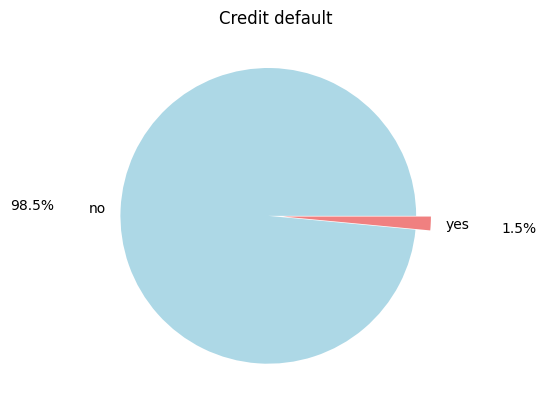

In [ ]:
# @title Analyse graphique des données bancaire clients

# Affichage des graphiques pour l'analyse (Caractéristiques bancaires des clients)

import plotly.graph_objects as go

# Répartition de Credit default
plt.title('Credit default')
df['default'].value_counts().plot(
        kind= 'pie',
        colors= ['lightblue', 'lightcoral'],
        autopct='%1.1f%%',
        pctdistance = 1.6,
        explode= (0.05, 0.05))
plt.ylabel('')

# Répartition de housing en fonction de deposit
a = df.groupby(['housing','deposit'],
              as_index=False)['age'].count().rename(columns={'age':'Count'})

a['percent'] = round(a['Count'] * 100 / a.groupby('housing')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x= 'housing',
             y= 'Count',
             text= 'percent',
             color= 'deposit',
             barmode= 'group',
             color_discrete_sequence= ['lightcoral', 'lightblue'],
             width= 600, height= 450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")
fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de Housing en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de loan en fonction de deposit
a = df.groupby(['loan','deposit'],
               as_index=False)['age'].count().rename(columns={'age':'Count'})

a['percent'] = round(a['Count'] * 100 / a.groupby('loan')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x= 'loan',
             y= 'Count',
             text= 'percent',
             color= 'deposit',
             barmode= 'group',
             color_discrete_sequence= ['lightcoral', 'lightblue'],
             width=600, height=450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")
fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de Loan en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de balance en fonction de deposit
x0 = df[df['deposit'] == 'yes']['balance']
x1 = df[df['deposit'] == 'no']['balance']

fig = go.Figure()
fig.add_trace(go.Box(x=x0,
                     name= 'deposit_yes',
                     marker_color= 'lightblue'))
fig.add_trace(go.Box(x=x1,
                     name= 'deposit_no',
                     marker_color= 'lightcoral'))

fig.update_layout(width= 700, height= 470, showlegend= False)
fig.update_layout(title_x= 0.5,
                  title_text= '<b style="color:black; font-size:110%;">Distribution de Balance en fonction de deposit </b>',
                  font_family= "Arial",
                  title_font_family= "Arial")
fig.update_traces(orientation='h')

fig.show()

### **3-2-2 Tests Statistiques**

In [ ]:
# @title Tests statistiques (Caractéristiques bancaires des clients)

import statsmodels.api

# Tests Khi-deux sur les variables Deposit et housing
ct = pd.crosstab(df['deposit'], df['housing'])
print(underline("test du chi2"))
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('\n')

# Tests Khi-deux sur les variables Deposit et loan
ct = pd.crosstab(df['deposit'], df['loan'])
print(underline("test du chi2"))
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('\n')

# Tests ANOVA sur les variables Deposit et balace
print(underline("test Anova"))
result = statsmodels.formula.api.ols('balance ~ deposit', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)
print('\n')

# Tests Khi-deux sur les variables housing et loan
ct = pd.crosstab(df['housing'], df['loan'])
display(ct)
resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")

# Tests ANOVA sur les variables housing et balance
print(underline("test Anova"))
result = statsmodels.formula.api.ols('balance ~ housing', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)
print('\n')

# Tests ANOVA sur les variables balance et loan
print(underline("test Anova"))
result = statsmodels.formula.api.ols('balance ~ loan', data=df).fit()
table = statsmodels.api.stats.anova_lm(result)
display(table)

test du chi2


housing,no,yes
deposit,,
no,2383,3230
yes,3147,1874


La statistique du test est :  433.38366359274784 
La p-valeur du test est :  2.9815396201512063e-96 



test du chi2


loan,no,yes
deposit,,
no,4654,959
yes,4548,473


La statistique du test est :  132.96260177101567 
La p-valeur du test est :  9.213107617626982e-31 



test Anova


,df,sum_sq,mean_sq,F,PR(>F)
deposit,1.0,6.786183e+08,6.786183e+08,65.668074,5.921443e-16
Residual,10632.0,1.098718e+11,1.033407e+07,NaN,NaN


loan,no,yes
housing,,
no,4914,616
yes,4288,816


La statistique du test est :  53.12395625892848 
La p-valeur du test est :  3.1314993088574437e-13 

test Anova


,df,sum_sq,mean_sq,F,PR(>F)
housing,1.0,6.524190e+08,6.524190e+08,63.117784,2.143794e-15
Residual,10632.0,1.098980e+11,1.033653e+07,NaN,NaN




test Anova


,df,sum_sq,mean_sq,F,PR(>F)
loan,1.0,7.843795e+08,7.843795e+08,75.975431,3.299232e-18
Residual,10632.0,1.097660e+11,1.032412e+07,NaN,NaN


## **3-3 Caractéristique de la campagne marqueting**

### **3-3-1 Visualisation**

In [ ]:
# @title Affichage des graphiques pour l'analyse (Caractéristiques de la campagne marketing)

# Répartition de tr_duree en fonction de deposit
a = df.groupby(['tr_duree','deposit'],
              as_index=False)['age'].count().rename(columns={'age':'Count'})
# age.count() => poutcome prk ?

a['percent'] = round(a['Count'] * 100 / a.groupby('tr_duree')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x='tr_duree',
             y='Count',
             text='percent',
             color='deposit',
             barmode='group',
             color_discrete_sequence=['lightcoral','lightblue'],
             width=600, height=450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de tr_duree en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de poutcome en fonction de deposit
a = df.groupby(['poutcome','deposit'],
              as_index=False)['age'].count().rename(columns={'age':'Count'})
# age.count() => poutcome prk ?

a['percent'] = round(a['Count'] * 100 / a.groupby('poutcome')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x='poutcome',
             y='Count',
             text='percent',
             color='deposit',
             barmode='group',
             color_discrete_sequence=['lightcoral','lightblue'],
             width=600, height=450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de poutcome en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de month en fonction de deposit
a = df.groupby(['month','deposit'],
              as_index=False)['age'].count().rename(columns={'age':'Count'})
# age.count() => poutcome prk ?

a['percent'] = round(a['Count'] * 100 / a.groupby('month')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x='month',
             y='Count',
             text='percent',
             color='deposit',
             barmode='group',
             color_discrete_sequence=['lightcoral','lightblue'],
             width=600, height=450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de month en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

# Répartition de nb_appels en fonction de deposit
a = df.groupby(['nb_appels','deposit'],
              as_index=False)['age'].count().rename(columns={'age':'Count'})
# age.count() => poutcome prk ?

a['percent'] = round(a['Count'] * 100 / a.groupby('nb_appels')['Count'].transform('sum'),1)
a['percent'] = a['percent'].apply(lambda x: '{}%'.format(x))

fig = px.bar(a,
             x='nb_appels',
             y='Count',
             text='percent',
             color='deposit',
             barmode='group',
             color_discrete_sequence=['lightcoral','lightblue'],
             width=600, height=450)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1)),textposition = "outside")

fig.update_layout(title_x=0.5,
                  showlegend=True,
                  title_text='<b style="color:black; font-size:110%;">Distribution de campaign en fonction de deposit</b>',
                  font_family="Arial",
                  title_font_family="Arial")
fig.show()

### **3-3-2 Tests Statistiques**

In [ ]:
# @title Tests statistiques (Caractéristiques de la campagne marketing)

# Deposit et duration
ct = pd.crosstab(df['deposit'], df['duration'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - ', '\n')

# Deposit et poutcom
ct = pd.crosstab(df['deposit'], df['poutcome'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - ', '\n')

# Deposit et month
ct = pd.crosstab(df['deposit'], df['month'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - ', '\n')

# Deposit et campaign
ct = pd.crosstab(df['deposit'], df['campaign'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - ', '\n')

# month et campaign
ct = pd.crosstab(df['month'], df['campaign'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")
print('- - - - - - - - - - - - - - - - - - - - - - - - ', '\n')

# month et poutcome
ct = pd.crosstab(df['month'], df['poutcome'])
display(ct)
print(underline("test du khi_2"))

resultats_chi2 = chi2_contingency(ct)
statistique = resultats_chi2[0]
p_valeur = resultats_chi2[1]
print("La statistique du test est : ", statistique, "\n"
      "La p-valeur du test est : ", p_valeur, "\n")

duration,2,3,4,5,6,7,8,9,10,11,...,2769,2770,2775,3076,3094,3102,3183,3253,3284,3881
deposit,,,,,,,,,,,,,,,,,,,,,
no,1,1,2,4,6,16,13,10,14,10,...,0,0,0,0,0,0,0,0,1,0
yes,0,0,0,0,0,0,1,0,0,1,...,1,1,1,1,1,1,1,1,0,1


test du khi_2
La statistique du test est :  3786.11297011878 
La p-valeur du test est :  2.5712882802491204e-216 

- - - - - - - - - - - - - - - - - - - - - - - -  



poutcome,failure,success,unknown
deposit,,,
no,589,88,4936
yes,587,917,3517


test du khi_2
La statistique du test est :  891.8390241690995 
La p-valeur du test est :  2.185830737011473e-194 

- - - - - - - - - - - - - - - - - - - - - - - -  



month,apr,aug,dec,feb,jan,jul,jun,mar,may,nov,oct,sep
deposit,,,,,,,,,,,,
no,331,798,10,322,188,844,644,27,1818,520,65,46
yes,543,659,93,418,132,586,523,241,888,390,297,251


test du khi_2
La statistique du test est :  982.2615786376072 
La p-valeur du test est :  1.2592968703224704e-203 

- - - - - - - - - - - - - - - - - - - - - - - -  



campaign,1,2,3,4,5,6,7,8,9,10,...,25,26,27,28,29,30,32,33,41,43
deposit,,,,,,,,,,,,,,,,,,,,,
no,2137,1551,678,437,230,167,85,91,49,35,...,3,3,1,1,1,4,1,1,1,1
yes,2431,1323,587,302,136,89,45,30,20,13,...,0,0,0,0,1,0,1,0,0,0


test du khi_2
La statistique du test est :  224.15556266712755 
La p-valeur du test est :  2.7641480188073742e-30 

- - - - - - - - - - - - - - - - - - - - - - - -  



campaign,1,2,3,4,5,6,7,8,9,10,...,25,26,27,28,29,30,32,33,41,43
month,,,,,,,,,,,,,,,,,,,,,
apr,475,228,94,40,22,7,3,3,1,0,...,0,0,0,0,0,0,0,0,0,0
aug,345,454,164,188,56,84,31,35,13,18,...,1,0,1,0,0,2,0,0,0,0
dec,42,30,20,2,4,1,2,1,0,1,...,0,0,0,0,0,0,0,0,0,0
feb,358,193,78,48,25,17,4,9,1,3,...,0,0,0,0,0,0,0,0,0,0
jan,176,95,28,13,4,2,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
jul,448,374,201,136,75,51,35,34,18,6,...,1,1,0,0,1,1,0,1,0,1
jun,460,297,156,84,42,35,20,13,13,8,...,1,2,0,1,1,1,0,0,0,0
mar,138,74,24,16,5,4,2,2,1,0,...,0,0,0,0,0,0,0,0,0,0
may,1215,729,352,160,98,48,24,22,18,11,...,0,0,0,0,0,0,2,0,1,0


test du khi_2
La statistique du test est :  1142.1975680009912 
La p-valeur du test est :  1.969188710485111e-81 

- - - - - - - - - - - - - - - - - - - - - - - -  



poutcome,failure,success,unknown
month,,,
apr,157,82,635
aug,87,136,1234
dec,12,34,57
feb,128,102,510
jan,40,38,242
jul,41,70,1319
jun,53,88,1026
mar,29,45,194
may,350,131,2225


test du khi_2
La statistique du test est :  902.7508546479615 
La p-valeur du test est :  9.23562543673332e-177 



# **4- Gestion des outliers**

## **4-1 Avant suppression des outliers**

In [ ]:
# @title Box plot : age, balance, duration, campaign avant suppressions des outliers

def plot_box(df, columns, fig_width=2000, fig_height=800, color='skyblue'):
    for column in columns:
        fig = px.box(df, x=column, hover_data=df.columns)
        fig.update_layout(title=f"<b>Boxplot de '{column}' </b>", width=fig_width, height=fig_height)
        fig.update_traces(marker=dict(color=color))
        fig.show()

# Appel de la fonction avec les colonnes spécifiées
columns_num = ['age', 'balance', 'duration', 'campaign']
plot_box(df, columns_num, fig_width=1200, fig_height=200, color='lightcoral')

In [ ]:
# @title Fonction de calcul des IQR

col_num = ['age', 'balance', 'duration', 'campaign']
df_num = df[col_num]

def calculate_iqr(df, columns, quantiles):
    """
    Calcule les valeurs de l'IQR (Interquartile Range) ainsi que les bornes supérieures et inférieures pour chaque colonne spécifiée.

    Parameters:
    - df (DataFrame): Le DataFrame contenant les données numérique.
    - columns (list): La liste des colonnes pour lesquelles calculer les valeurs. col_num = ['a remplir]
    - quantiles (list): La liste des quantiles à calculer. quant = ['a remplir']

    Returns:
    - dict: Un dictionnaire contenant les valeurs de l'IQR, les bornes supérieures et inférieures pour chaque colonne spécifiée.
    - pour y acceder : result_iqr[...]
    """

    quant_1 = {}
    quant_3 = {}

    # Boucle pour calculer les quantiles pour chaque colonne numérique
    for column in columns:
        quantiles_column = df[column].quantile(quantiles)
        quant_1[column] = quantiles_column.iloc[0]
        quant_3[column] = quantiles_column.iloc[2]

    # Calculer les IQR
    iqr_values = {f'IQR_{column}': quant_3[column] - quant_1[column] for column in columns}

    # Calculer les bornes supérieures et inférieures pour chaque colonne
    iqr_sup_values = {f'IQR_sup_{column}': quant_3[column] + (1.5 * iqr_values[f'IQR_{column}']) for column in columns}
    iqr_inf_values = {f'IQR_inf_{column}': quant_1[column] - (1.5 * iqr_values[f'IQR_{column}']) for column in columns}

    return {**iqr_values, **iqr_sup_values, **iqr_inf_values}

quant = [0.25, 0.5, 0.75]

result_iqr = calculate_iqr(df_num, col_num, quant)

# Afficher les résultats
for key, value in result_iqr.items():
    print(f"{key}: {value}")

IQR_age: 17.0
IQR_balance: 1574.0
IQR_duration: 362.0
IQR_campaign: 2.0
IQR_sup_age: 74.5
IQR_sup_balance: 4054.0
IQR_sup_duration: 1043.0
IQR_sup_campaign: 6.0
IQR_inf_age: 6.5
IQR_inf_balance: -2242.0
IQR_inf_duration: -405.0
IQR_inf_campaign: -2.0


In [ ]:
# @title Suppression des valeurs abérantes

df = df[(df['age'] >= result_iqr['IQR_inf_age']) & (df['age'] <= result_iqr['IQR_sup_age'])]
df = df[(df['balance'] >= result_iqr['IQR_inf_balance']) & (df['balance'] <= result_iqr['IQR_sup_balance'])]
df = df[(df['duration'] >= result_iqr['IQR_inf_duration']) & (df['duration'] <= result_iqr['IQR_sup_duration'])]
df = df[(df['campaign'] >= result_iqr['IQR_inf_campaign']) & (df['campaign'] <= result_iqr['IQR_sup_campaign'])]

print("Nous avons supprimé", round((100 - (df.shape[0] * 100) / shape_initiale[0]), 2), "% des lignes de notre dataframe initial")
print("Cependant il nous reste encore :", df.shape[0], "lignes (clients) pour le reste des études")

Nous avons supprimé 23.88 % des lignes de notre dataframe initial
Cependant il nous reste encore : 8496 lignes (clients) pour le reste des études


## **4-2 Après suppression des outliers**

In [ ]:
# @title Box plot : age, balance, duration, campaign après suppressions des outliers

def plot_box(df, columns, fig_width=2000, fig_height=800, color='skyblue'):
    for column in columns:
        fig = px.box(df, x=column, hover_data=df.columns)
        fig.update_layout(title=f"<b>Boxplot de '{column}' </b>", width=fig_width, height=fig_height)
        fig.update_traces(marker=dict(color=color))
        fig.show()

# Appel de la fonction avec les colonnes spécifiées
columns_num = ['age', 'balance', 'duration', 'campaign']
plot_box(df, columns_num, fig_width=1200, fig_height=200, color='lightblue')

## **4-3 Finalisation de l'analyse**

In [ ]:
# @title Suppression des colonnes inutiles pour la suite

col_sup = ['tr_duree', 'nb_appels']
df = df.drop(col_sup, axis=1)

In [ ]:
# Affichage du nouveau jeu de données

df.head()

,age,job,marital,education,default,balance,housing,loan,day,month,duration,campaign,pdays,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,5,may,1042,1,-1,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,5,may,579,1,-1,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,5,may,673,2,-1,unknown,yes
5,42,management,single,tertiary,no,0,yes,yes,5,may,562,2,-1,unknown,yes
7,60,retired,divorced,secondary,no,545,yes,no,6,may,1030,1,-1,unknown,yes


In [ ]:
# @title Affichage des informations du nouveau jeu de données
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8496 entries, 0 to 11161
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        8496 non-null   int64 
 1   job        8496 non-null   object
 2   marital    8496 non-null   object
 3   education  8496 non-null   object
 4   default    8496 non-null   object
 5   balance    8496 non-null   int64 
 6   housing    8496 non-null   object
 7   loan       8496 non-null   object
 8   day        8496 non-null   int64 
 9   month      8496 non-null   object
 10  duration   8496 non-null   int64 
 11  campaign   8496 non-null   int64 
 12  pdays      8496 non-null   int64 
 13  poutcome   8496 non-null   object
 14  deposit    8496 non-null   object
dtypes: int64(6), object(9)
memory usage: 1.0+ MB


In [ ]:
# @title Création d'un nouveau fichier pour la suite du projet
df.to_csv(
    "/content/drive/MyDrive/DataScientest /Oct_cda_bankmarketing/Commun/2_bank_clean.csv",
    sep=','
)



---


* Création du fichier 2_bank_clean.csv pour l'utiliser pour la standardisation, dans la suite de l'étude.

---

